In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/samplepesu/Training Dataset_csv/V_HELICOPTER_038_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_HELICOPTER_017_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_DRONE_025_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_DRONE_073_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_BIRD_007_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_HELICOPTER_012_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_AIRPLANE_041_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_HELICOPTER_033_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_BIRD_001_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_DRONE_051_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_DRONE_069_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_DRONE_043_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_DRONE_074_LABELS.csv
/kaggle/input/samplepesu/Training Dataset_csv/V_DRONE_008_LABELS.csv
/kaggle/input

In [2]:
import os
import cv2
import numpy as np
import shutil
from tqdm import tqdm
import matplotlib.pyplot as plt
import pandas as pd

In [3]:
# Clear output folder
import os

def remove_folder_contents(folder):
    for the_file in os.listdir(folder):
        file_path = os.path.join(folder, the_file)
        try:
            if os.path.isfile(file_path):
                os.unlink(file_path)
            elif os.path.isdir(file_path):
                remove_folder_contents(file_path)
                os.rmdir(file_path)
        except Exception as e:
            print(e)

folder_path = '/kaggle/working'
remove_folder_contents(folder_path)
os.rmdir(folder_path)

OSError: [Errno 16] Device or resource busy: '/kaggle/working'

# To preprocess the data and extract it in an output folder

In [4]:
os.mkdir("/kaggle/working/dataset")
os.mkdir("/kaggle/working/dataset/images")
os.mkdir("/kaggle/working/dataset/images/AIRPLANE")
os.mkdir("/kaggle/working/dataset/images/BIRD")
os.mkdir("/kaggle/working/dataset/images/DRONE")
os.mkdir("/kaggle/working/dataset/images/HELICOPTER")

os.mkdir("/kaggle/working/dataset/annotations")

In [17]:
train_video_path = "/kaggle/input/samplepesu/Training Dataset_Videos/"
test = "/kaggle/input/samplepesu/Test_data_images"
train_csv_path = "/kaggle/input/train/training.csv"

In [6]:
shutil.rmtree("/kaggle/working/images/")
shutil.rmtree("/kaggle/working/images/AIRPLANE")
shutil.rmtree("/kaggle/working/images/BIRD")
shutil.rmtree("/kaggle/working/images/DRONE")
shutil.rmtree("/kaggle/working/images/HELICOPTER")

os.mkdir("/kaggle/working/images")
os.mkdir("/kaggle/working/images/AIRPLANE")
os.mkdir("/kaggle/working/images/BIRD")
os.mkdir("/kaggle/working/images/DRONE")
os.mkdir("/kaggle/working/images/HELICOPTER")


FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/working/images/'

In [7]:
count = 0
fps = 33.34
files = os.listdir('/kaggle/input/samplepesu/Training Dataset_Videos/')
for file in tqdm(files):
    count +=1
    cap = cv2.VideoCapture(train_video_path+file)
#     print(train_video_path+file)
#     /kaggle/input/samplepesu/Training Dataset_Videos/V_AIRPLANE_001.mp4
#     /kaggle/input/samplepesu/Training_Dataset_Videos/V_DRONE_022.mp4
#     print(train_video_path+file)
    ret, frame = cap.read()
    ct=0
#     print(ret)
    while ret:
        cv2.imwrite(f"/kaggle/working/dataset/images/" +file.split("_")[1]+ "/"+file.split("_")[2].split(".")[0]+"_"+str(ct)+".jpg",frame)
#         print(f"/kaggle/working/dataset/images/" +file.split("_")[1]+ "/"+file.split("_")[2].split(".")[0]+"_"+str(ct)+".jpg")
        ret, frame = cap.read()
        ct+=1

100%|██████████| 280/280 [07:39<00:00,  1.64s/it]


In [13]:
train_csv_path

'/kaggle/input/trainingcsv/train (4).csv'

In [18]:
#if train_csv_path!='/kaggle/input/trainingcsv/train (4).csv'
df = pd.read_csv(train_csv_path)
df.head()
#df
df.columns = df.columns.str.replace('/', '')

In [19]:
df_airplane = df[df['Label'] == 'AIRPLANE'].dropna().to_csv('/kaggle/working/dataset/annotations/AIRPLANE.csv',header=False)
df_bird = df[df['Label'] == 'BIRD'].dropna().to_csv('/kaggle/working/dataset/annotations/BIRD.csv',header=False)
df_helicopter = df[df['Label'] == 'HELICOPTER'].dropna().to_csv('/kaggle/working/dataset/annotations/HELICOPTER.csv',header=False)
df_drone = df[df['Label'] == 'DRONE'].dropna().to_csv('/kaggle/working/dataset/annotations/DRONE.csv',header=False)

In [20]:
import shutil
shutil.make_archive("images", 'zip', "/kaggle/working/dataset/")

'/kaggle/working/images.zip'

In [21]:
from IPython.display import FileLink
FileLink(r'images.zip')

/kaggle/working/images.zip

# Building The Model

* **Creating The py file**

In [22]:
# import the necessary packages
import os
# define the base path to the input dataset and then use it to derive
# the path to the input images and annotation CSV files
BASE_PATH = "/kaggle/working/dataset"
IMAGES_PATH = os.path.sep.join([BASE_PATH, "images"])
ANNOTS_PATH = os.path.sep.join([BASE_PATH, "annotations"])

In [23]:
os.mkdir('/kaggle/working/output')

In [24]:
# define the path to the base output directory
BASE_OUTPUT = "/kaggle/working/output"
# define the path to the output model, label binarizer, plots output
# directory, and testing image paths
MODEL_PATH = os.path.sep.join([BASE_OUTPUT, "detector.h5"])
LB_PATH = os.path.sep.join([BASE_OUTPUT, "lb.pickle"])
PLOTS_PATH = os.path.sep.join([BASE_OUTPUT, "plots"])
TEST_PATHS = os.path.sep.join([BASE_OUTPUT, "test_paths.txt"])

In [25]:
# initialize our initial learning rate, number of epochs to train
# for, and the batch size
INIT_LR = 1e-4
NUM_EPOCHS = 20
BATCH_SIZE = 32

In [26]:
!pip install imutils

  Preparing metadata (setup.py) ... done
  Created wheel for imutils: filename=imutils-0.5.4-py3-none-any.whl size=25861 sha256=62544a857efc1118ad906a1e34b28196c5964113d95f6911dea7f905f226b2a5
  Stored in directory: /root/.cache/pip/wheels/35/e4/69/cb99d996d14a2971b79b990d68b05a17d58ce530ff96090dfc
Successfully built imutils


In [27]:
# import the necessary packages
# from pyimagesearch import config
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import pickle
import cv2
import os
import random
from tqdm import tqdm

print("done")

done


In [28]:
# initialize the list of data (images), class labels, target bounding
# box coordinates, and image paths
print("Loading Dataset")
data = []
labels = []
bboxes = []
imagePaths = []

Loading Dataset


In [29]:
# loop over all CSV files in the annotations directory
for csvPath in paths.list_files(ANNOTS_PATH, validExts=(".csv")):
    # load the contents of the current CSV annotations file
    rows = open(csvPath).read().strip().split("\n")
    # loop over the rows
    check = []
    rows1 = []
    i = 0
    while(i < 1000):
        j = random.randrange(1, len(rows))
        if j not in check:
            check.append(j)
            rows1.append(rows[j])
            i += 1
        else:
            continue
    for row in tqdm(rows1):
        # break the row into the filename, bounding box coordinates,
        # and class label
        row = row.split(',')
        filename = row[1]
        label = row[2]
        startX = float(row[3])
        startY = float(row[4])
        endX = float(row[5])
        endY = float(row[6])
        endX = startX + endX
        endY = startY + endY
        # derive the path to the input image, load the image (in
        # OpenCV format), and grab its dimensions
        imagePath = os.path.sep.join([IMAGES_PATH, label, filename.split('/')[-1]])
        image = cv2.imread(imagePath)
        
        (h, w) = image.shape[:2]
        # scale the bounding box coordinates relative to the spatial
        # dimensions of the input image
        startX = float(startX) / w
        startY = float(startY) / h
        endX = float(endX) / w
        endY = float(endY) / h

        # load the image and preprocess it
        image = load_img(imagePath, target_size=(224, 224))
        image = img_to_array(image)
        # update our list of data, class labels, bounding boxes, and
        # image paths
        data.append(image)
        labels.append(label)
        bboxes.append((startX, startY, endX, endY))
        imagePaths.append(imagePath)



100%|██████████| 1000/1000 [00:07<00:00, 127.40it/s]


In [30]:
# convert the data, class labels, bounding boxes, and image paths to
# NumPy arrays, scaling the input pixel intensities from the range
# [0, 255] to [0, 1]
data = np.array(data, dtype="float32") / 255.0
labels = np.array(labels)
bboxes = np.array(bboxes, dtype="float32")
imagePaths = np.array(imagePaths)
# perform one-hot encoding on the labels
lb = LabelBinarizer()
labels = lb.fit_transform(labels)
# only there are only two labels in the dataset, then we need to use
# Keras/TensorFlow's utility function as well
if len(lb.classes_) == 2:
	labels = to_categorical(labels)

In [31]:
# partition the data into training and testing splits using 80% of
# the data for training and the remaining 20% for testing
split = train_test_split(data, labels, bboxes, imagePaths,
	test_size=0.20, random_state=42)
# unpack the data split
(trainImages, testImages) = split[:2]
(trainLabels, testLabels) = split[2:4]
(trainBBoxes, testBBoxes) = split[4:6]
(trainPaths, testPaths) = split[6:]
# write the testing image paths to disk so that we can use then
# when evaluating/testing our object detector
print("[INFO] saving testing image paths...")
f = open(TEST_PATHS, "w")
f.write("\n".join(testPaths))
f.close()

[INFO] saving testing image paths...


In [32]:
# load the VGG16 network, ensuring the head FC layers are left off
vgg = VGG16(weights="imagenet", include_top=False,
	input_tensor=Input(shape=(224, 224, 3)))
# freeze all VGG layers so they will *not* be updated during the
# training process
vgg.trainable = False
# flatten the max-pooling output of VGG
flatten = vgg.output
flatten = Flatten()(flatten)

58889256/58889256 [==============================] - 0s 0us/step


In [33]:
# construct a fully-connected layer header to output the predicted
# bounding box coordinates
bboxHead = Dense(128, activation="relu")(flatten)
bboxHead = Dense(64, activation="relu")(bboxHead)
bboxHead = Dense(32, activation="relu")(bboxHead)
bboxHead = Dense(4, activation="sigmoid",
	name="bounding_box")(bboxHead)
# construct a second fully-connected layer head, this one to predict
# the class label
softmaxHead = Dense(512, activation="relu")(flatten)
softmaxHead = Dropout(0.5)(softmaxHead)
softmaxHead = Dense(512, activation="relu")(softmaxHead)
softmaxHead = Dropout(0.5)(softmaxHead)
softmaxHead = Dense(len(lb.classes_), activation="softmax",
	name="class_label")(softmaxHead)
# put together our model which accept an input image and then output
# bounding box coordinates and a class label
model = Model(
	inputs=vgg.input,
	outputs=(bboxHead, softmaxHead))

In [34]:
# define a dictionary to set the loss methods -- categorical
# cross-entropy for the class label head and mean absolute error
# for the bounding box head
losses = {
	"class_label": "categorical_crossentropy",
	"bounding_box": "mean_squared_error",
}
# define a dictionary that specifies the weights per loss (both the
# class label and bounding box outputs will receive equal weight)
lossWeights = {
	"class_label": 1.0,
	"bounding_box": 1.0
}
# initialize the optimizer, compile the model, and show the model
# summary
opt = Adam(lr=INIT_LR)
model.compile(loss=losses, optimizer=opt, metrics=["accuracy"], loss_weights=lossWeights)
print(model.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 224, 224, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 224, 224, 64  36928       ['block1_conv1[0][0]']           
                                )                                                             

In [35]:
# construct a dictionary for our target training outputs
trainTargets = {
	"class_label": trainLabels,
	"bounding_box": trainBBoxes
}
# construct a second dictionary, this one for our target testing
# outputs
testTargets = {
	"class_label": testLabels,
	"bounding_box": testBBoxes
}

In [36]:
# train the network for bounding box regression and class label
# prediction
print("[INFO] training model...")
H = model.fit(
	trainImages, trainTargets,
	validation_data=(testImages, testTargets),
	batch_size=BATCH_SIZE,
	epochs=NUM_EPOCHS,
	verbose=1)
# serialize the model to disk
print("[INFO] saving object detector model...")
model.save(MODEL_PATH, save_format="h5")
# serialize the label binarizer to disk
print("[INFO] saving label binarizer...")
f = open(LB_PATH, "wb")
f.write(pickle.dumps(lb))
f.close()

[INFO] training model...
Epoch 1/20
100/100 [==============================] - 22s 110ms/step - loss: 1.2357 - bounding_box_loss: 0.0248 - class_label_loss: 1.2109 - bounding_box_accuracy: 0.5191 - class_label_accuracy: 0.5694 - val_loss: 0.4941 - val_bounding_box_loss: 0.0186 - val_class_label_loss: 0.4755 - val_bounding_box_accuracy: 0.5725 - val_class_label_accuracy: 0.8150
Epoch 2/20
100/100 [==============================] - 10s 98ms/step - loss: 0.5734 - bounding_box_loss: 0.0182 - class_label_loss: 0.5552 - bounding_box_accuracy: 0.6275 - class_label_accuracy: 0.7684 - val_loss: 0.3432 - val_bounding_box_loss: 0.0170 - val_class_label_loss: 0.3262 - val_bounding_box_accuracy: 0.7000 - val_class_label_accuracy: 0.8650
Epoch 3/20
100/100 [==============================] - 10s 97ms/step - loss: 0.4796 - bounding_box_loss: 0.0165 - class_label_loss: 0.4632 - bounding_box_accuracy: 0.6825 - class_label_accuracy: 0.7994 - val_loss: 0.2807 - val_bounding_box_loss: 0.0154 - val_class_la

In [37]:
os.mkdir("/kaggle/working/output/plots")

In [38]:
# plot the total loss, label loss, and bounding box loss
lossNames = ["loss", "class_label_loss", "bounding_box_loss"]
N = np.arange(0, NUM_EPOCHS)
plt.style.use("ggplot")
(fig, ax) = plt.subplots(3, 1, figsize=(13, 13))
# loop over the loss names
for (i, l) in enumerate(lossNames):
	# plot the loss for both the training and validation data
	title = "Loss for {}".format(l) if l != "loss" else "Total loss"
	ax[i].set_title(title)
	ax[i].set_xlabel("Epoch #")
	ax[i].set_ylabel("Loss")
	ax[i].plot(N, H.history[l], label=l)
	ax[i].plot(N, H.history["val_" + l], label="val_" + l)
	ax[i].legend()
# save the losses figure and create a new figure for the accuracies
plt.tight_layout()
plotPath = os.path.sep.join([PLOTS_PATH, "losses.png"])
plt.savefig(plotPath)
plt.close()

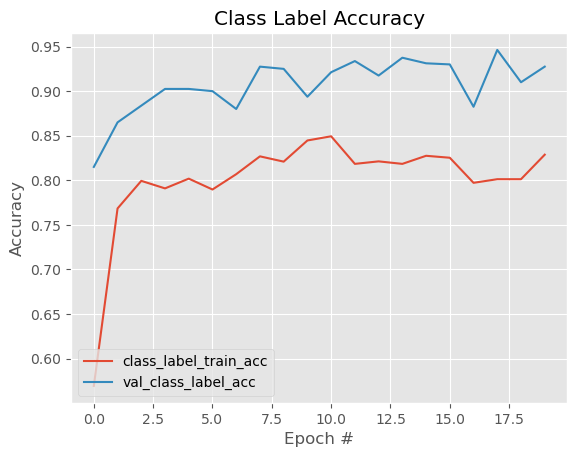

In [39]:
# create a new figure for the accuracies
plt.style.use("ggplot")
plt.figure()
plt.plot(N, H.history["class_label_accuracy"],
	label="class_label_train_acc")
plt.plot(N, H.history["val_class_label_accuracy"],
	label="val_class_label_acc")
plt.title("Class Label Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Accuracy")
plt.legend(loc="lower left")
# save the accuracies plot
plotPath = os.path.sep.join([PLOTS_PATH, "accs.png"])
plt.savefig(plotPath)

In [40]:
os.listdir('/kaggle/working/output')

['detector.h5', 'lb.pickle', 'plots', 'test_paths.txt']

In [41]:
from tensorflow.keras.models import load_model

In [42]:
model = load_model('/kaggle/working/output/detector.h5')

# Predicting The results

In [43]:
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.models import load_model
import numpy as np
import mimetypes
import argparse
import imutils
import pickle
import cv2
import os

In [44]:
# load our object detector and label binarizer from disk
print("[INFO] loading object detector...")
model = load_model(MODEL_PATH)
lb = pickle.loads(open(LB_PATH, "rb").read())

[INFO] loading object detector...


In [45]:
imagePaths = [test + '/' + i for i in os.listdir(test)]
imagePaths

['/kaggle/input/samplepesu/Test_data_images/14.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/55.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/18.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/96.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/93.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/56.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/91.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/16.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/44.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/31.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/25.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/43.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/67.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/72.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/27.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/22.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/24.jpeg',
 '/kaggle/input/samplepesu/Test_data_images/79.jpeg',
 '/kaggle/input/samplepesu/T

1/1 [==============================] - 0s 22ms/step


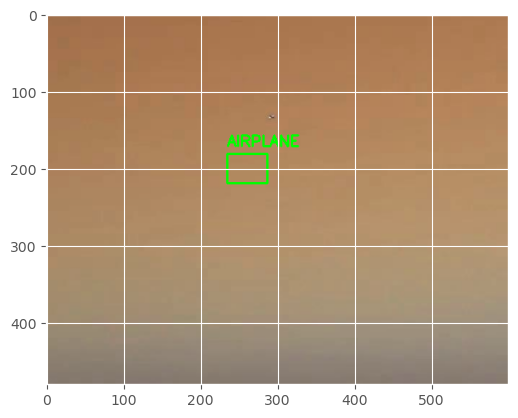

1/1 [==============================] - 0s 23ms/step


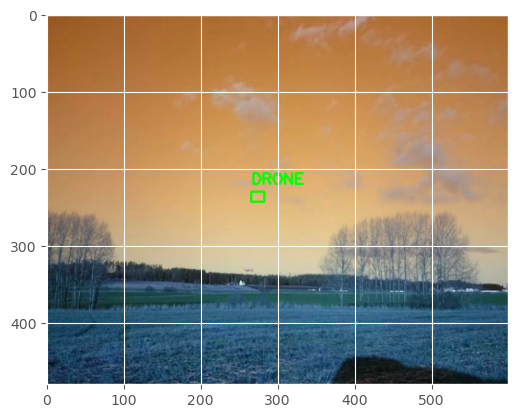

1/1 [==============================] - 0s 21ms/step


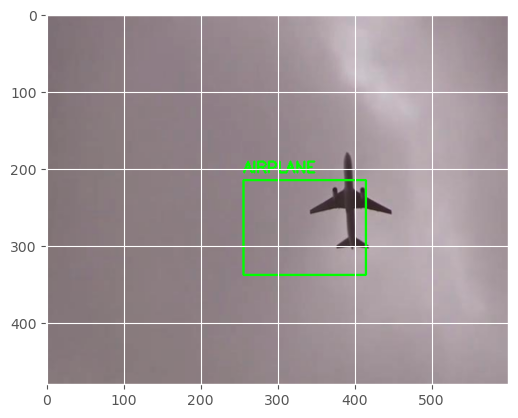

1/1 [==============================] - 0s 21ms/step


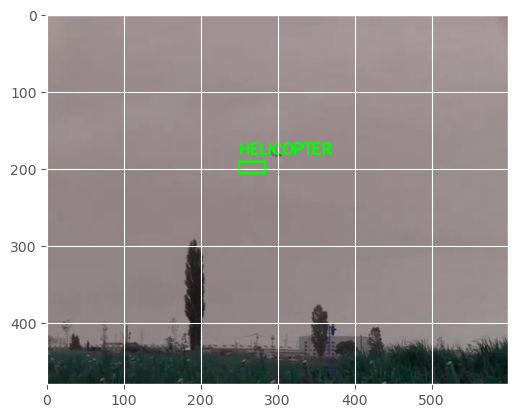

1/1 [==============================] - 0s 21ms/step


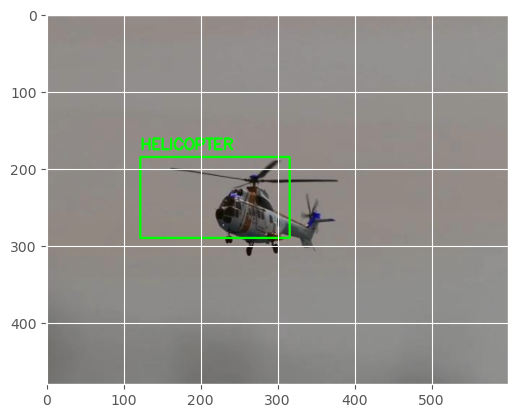

1/1 [==============================] - 0s 21ms/step


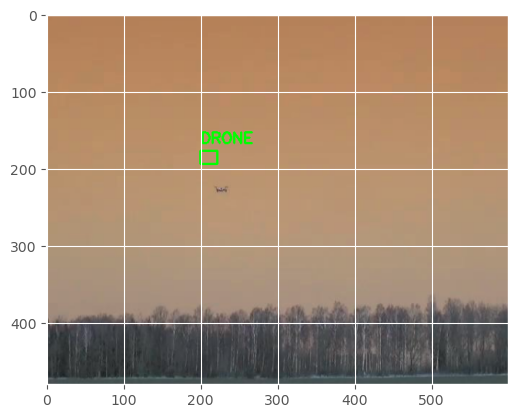

1/1 [==============================] - 0s 23ms/step


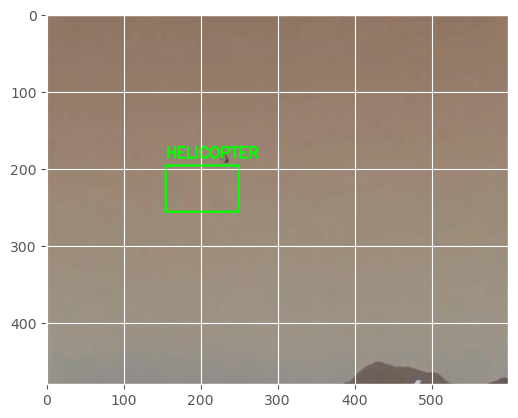

1/1 [==============================] - 0s 22ms/step


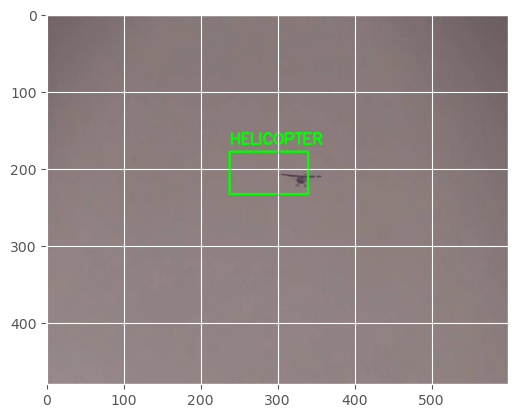

1/1 [==============================] - 0s 20ms/step


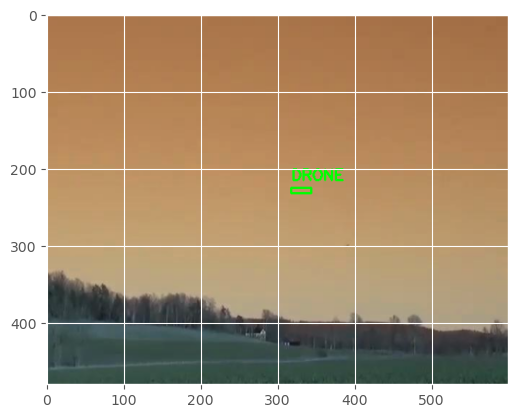

1/1 [==============================] - 0s 21ms/step


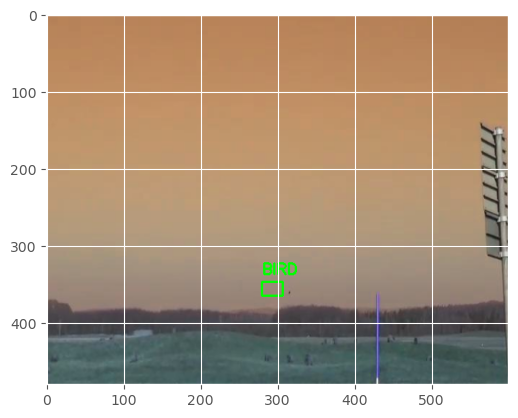

1/1 [==============================] - 0s 21ms/step


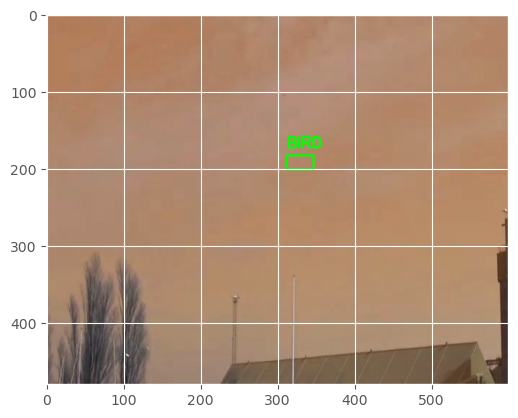

1/1 [==============================] - 0s 22ms/step


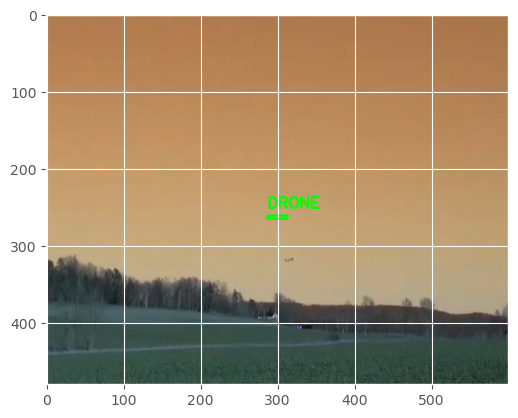

1/1 [==============================] - 0s 25ms/step


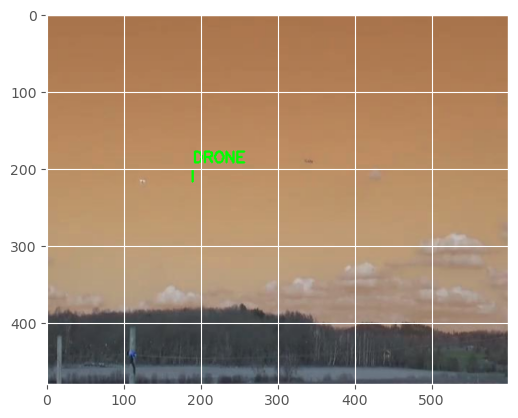

1/1 [==============================] - 0s 25ms/step


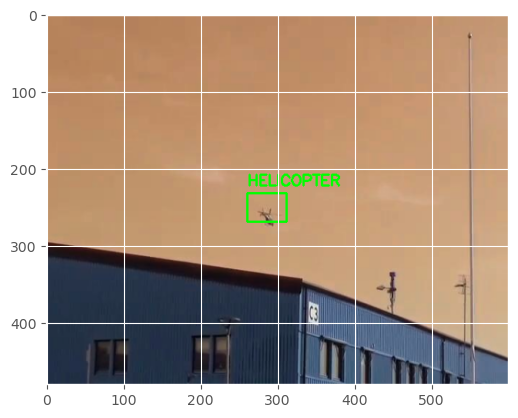

1/1 [==============================] - 0s 25ms/step


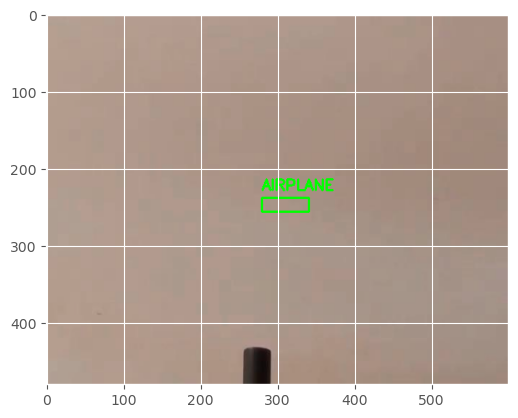

1/1 [==============================] - 0s 27ms/step


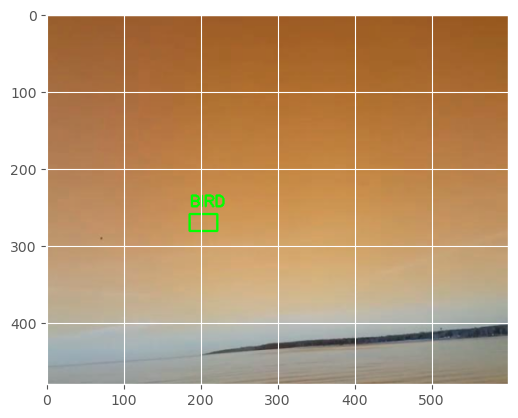

1/1 [==============================] - 0s 23ms/step


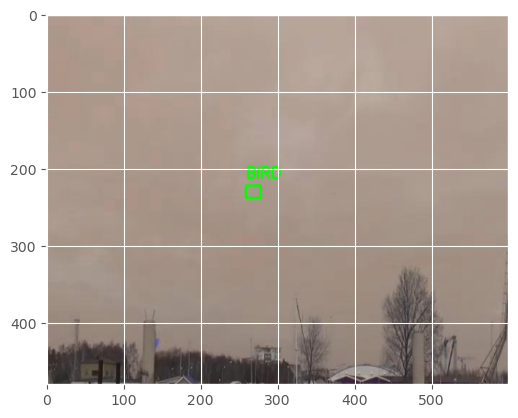

1/1 [==============================] - 0s 23ms/step


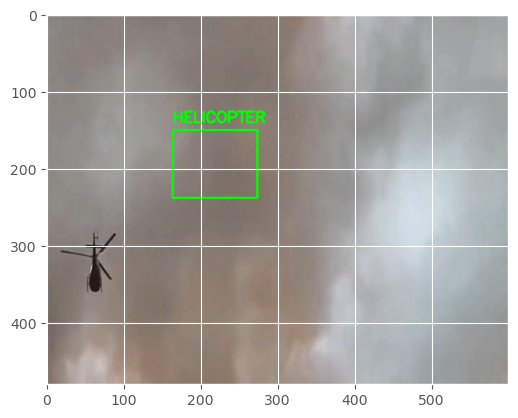

1/1 [==============================] - 0s 25ms/step


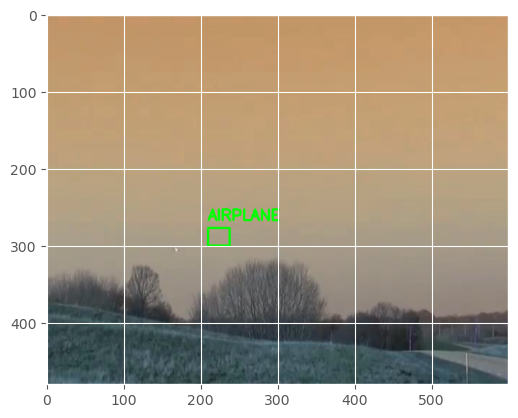

1/1 [==============================] - 0s 25ms/step


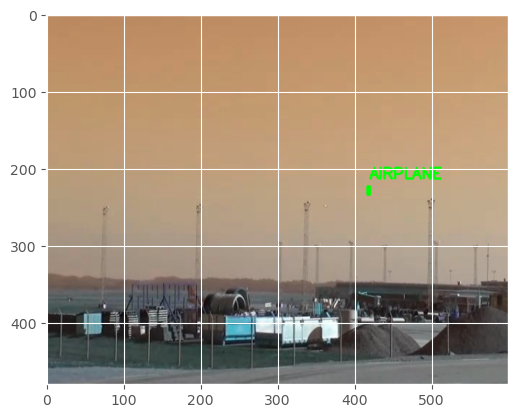

1/1 [==============================] - 0s 22ms/step


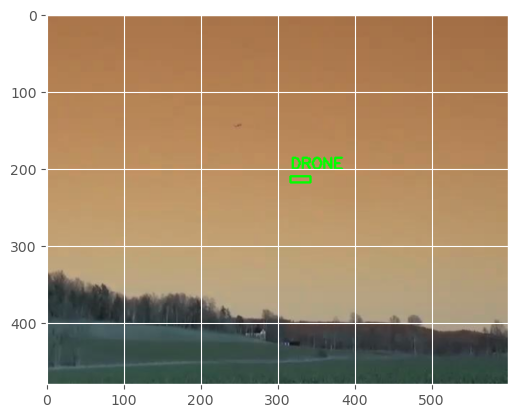

1/1 [==============================] - 0s 24ms/step


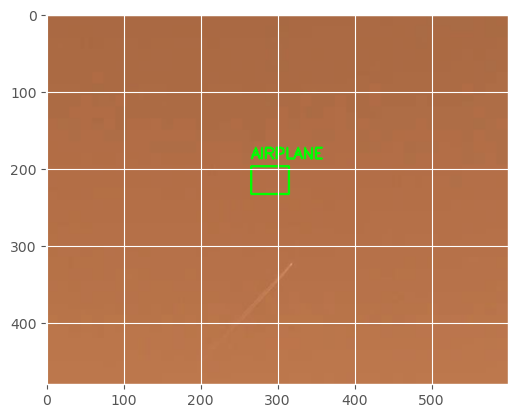

1/1 [==============================] - 0s 25ms/step


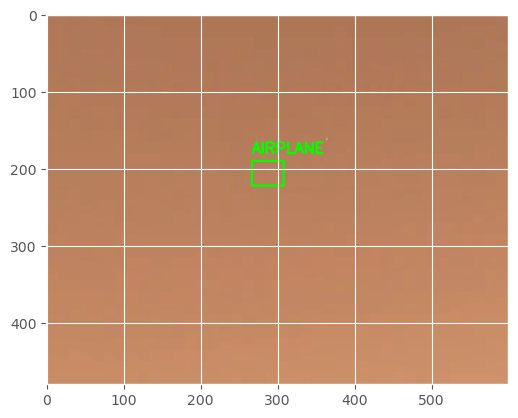

1/1 [==============================] - 0s 23ms/step


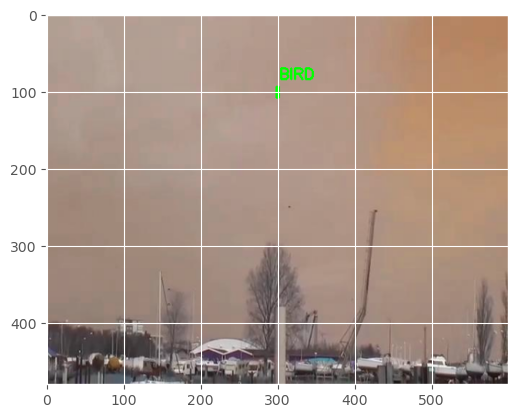

1/1 [==============================] - 0s 26ms/step


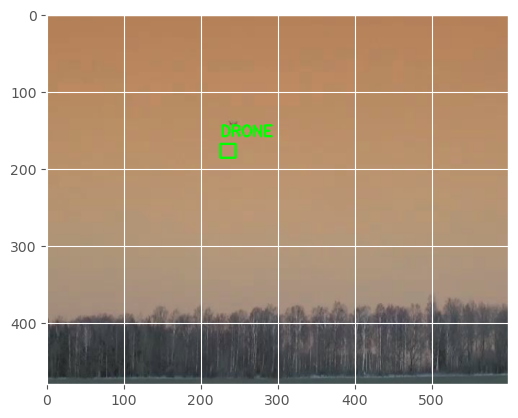

1/1 [==============================] - 0s 22ms/step


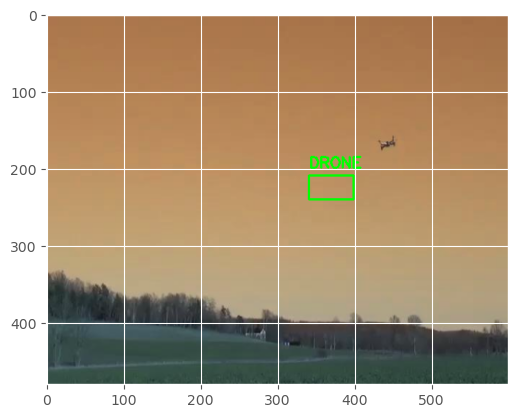

1/1 [==============================] - 0s 22ms/step


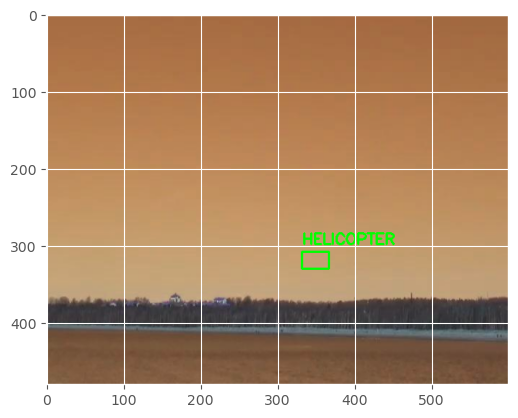

1/1 [==============================] - 0s 22ms/step


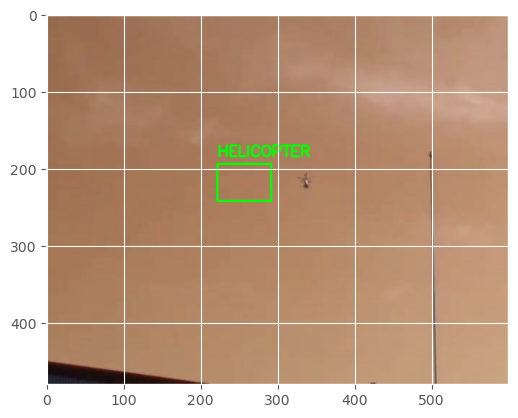

1/1 [==============================] - 0s 22ms/step


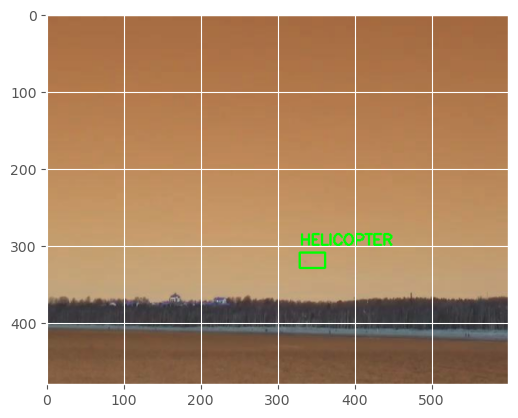

1/1 [==============================] - 0s 21ms/step


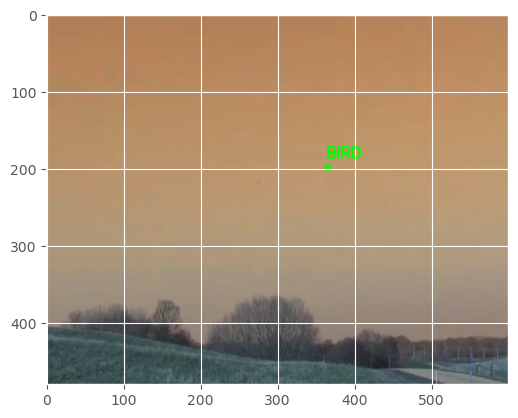

1/1 [==============================] - 0s 22ms/step


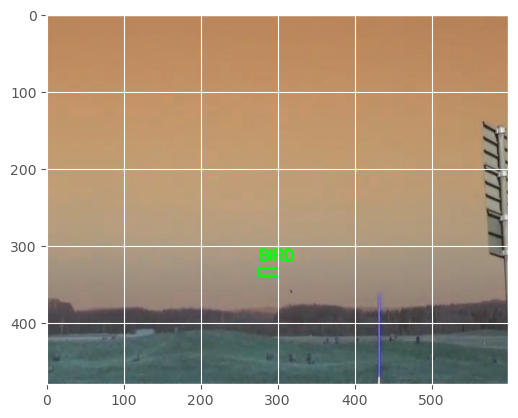

1/1 [==============================] - 0s 22ms/step


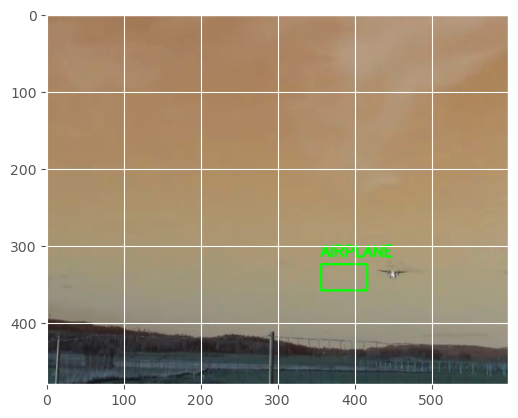

1/1 [==============================] - 0s 22ms/step


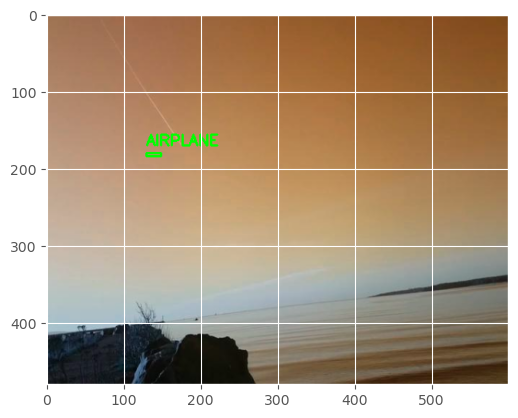

1/1 [==============================] - 0s 25ms/step


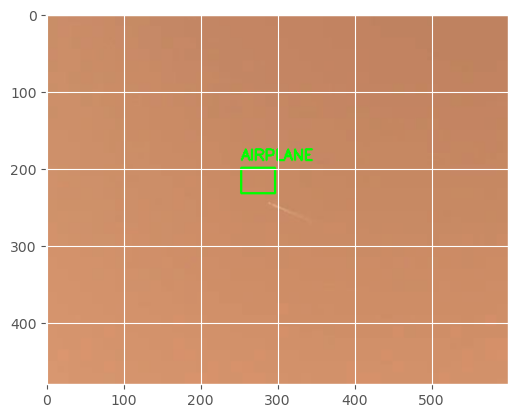

1/1 [==============================] - 0s 21ms/step


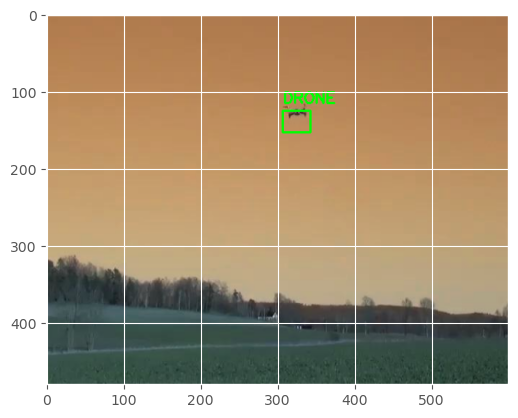

1/1 [==============================] - 0s 22ms/step


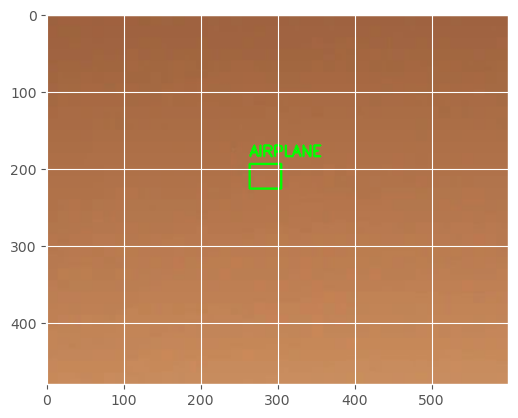

1/1 [==============================] - 0s 22ms/step


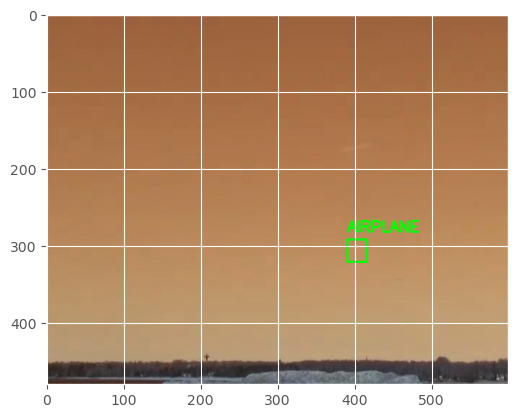

1/1 [==============================] - 0s 23ms/step


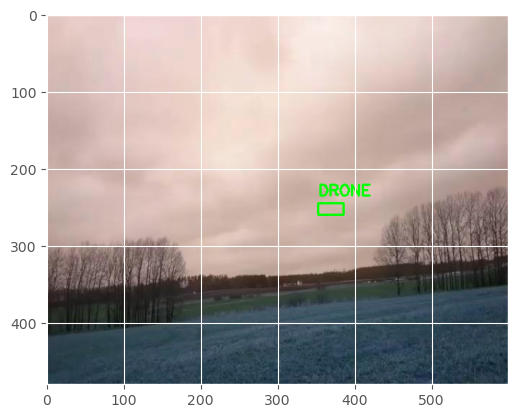

1/1 [==============================] - 0s 21ms/step


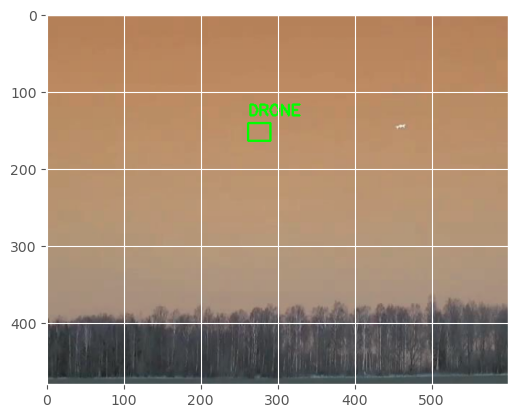

1/1 [==============================] - 0s 20ms/step


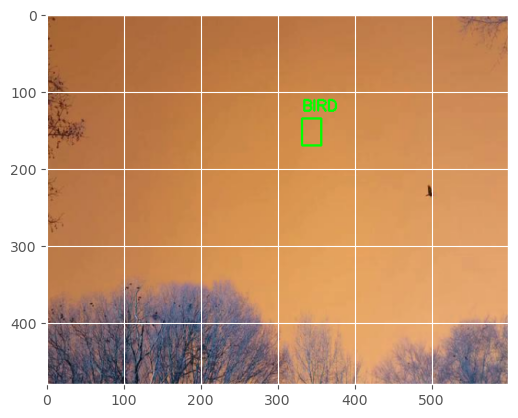

1/1 [==============================] - 0s 22ms/step


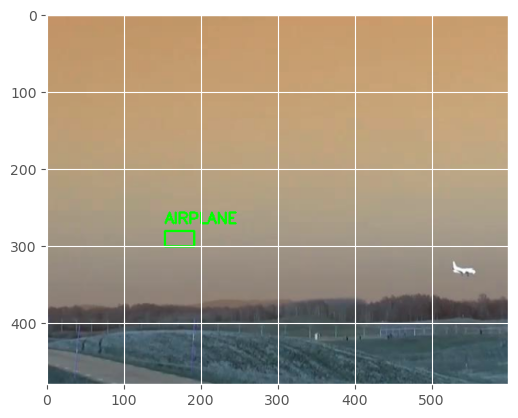

1/1 [==============================] - 0s 22ms/step


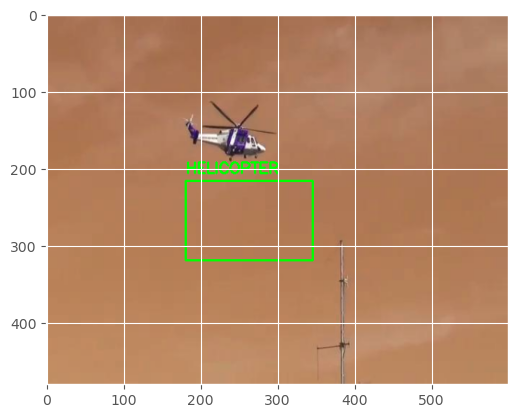

1/1 [==============================] - 0s 22ms/step


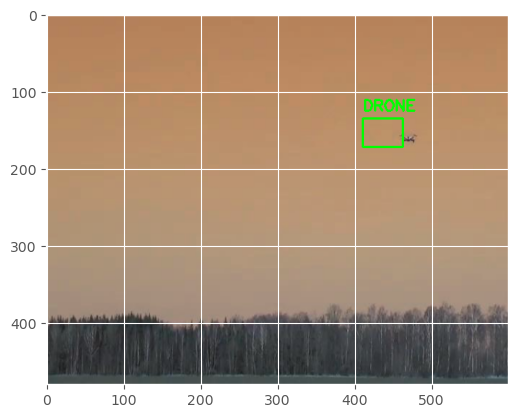

1/1 [==============================] - 0s 21ms/step


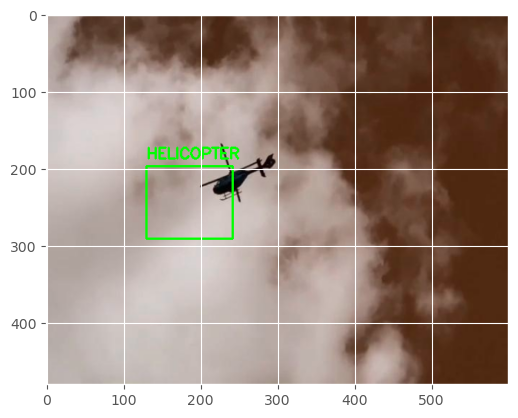

1/1 [==============================] - 0s 21ms/step


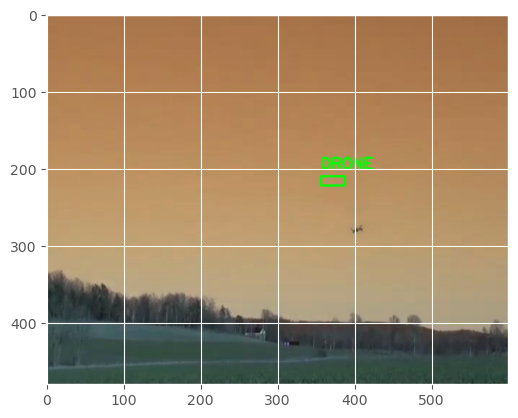

1/1 [==============================] - 0s 21ms/step


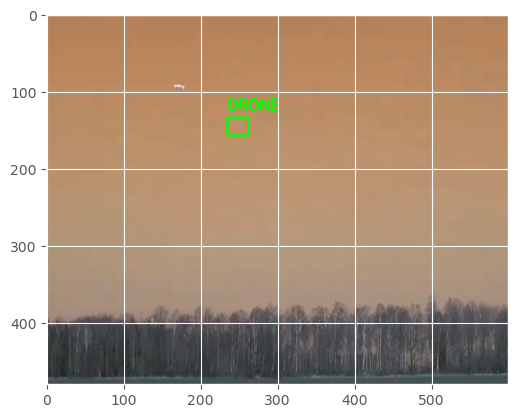

1/1 [==============================] - 0s 21ms/step


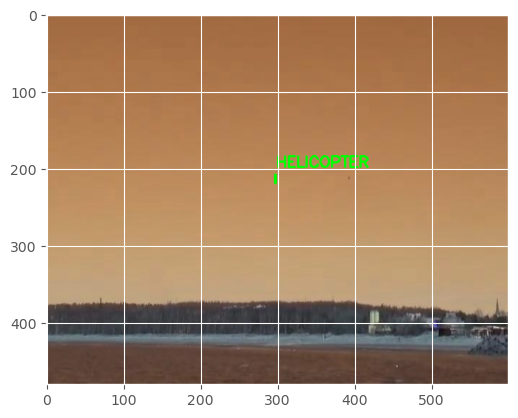

1/1 [==============================] - 0s 21ms/step


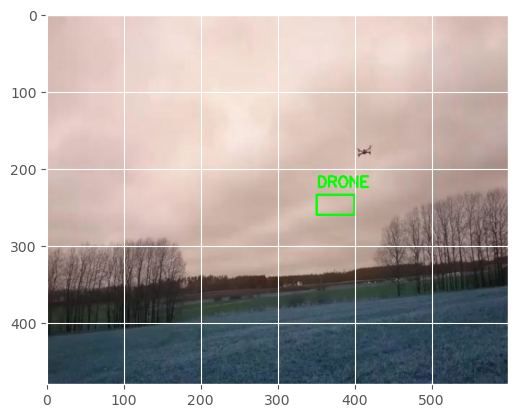

1/1 [==============================] - 0s 25ms/step


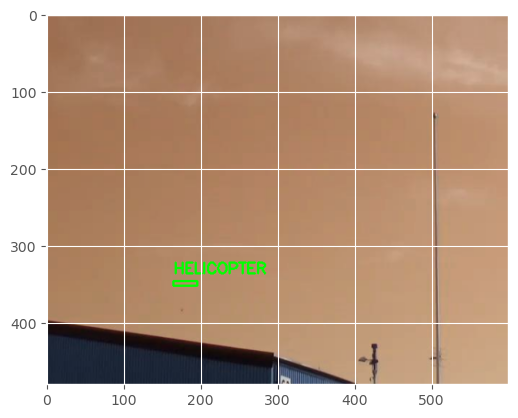

1/1 [==============================] - 0s 21ms/step


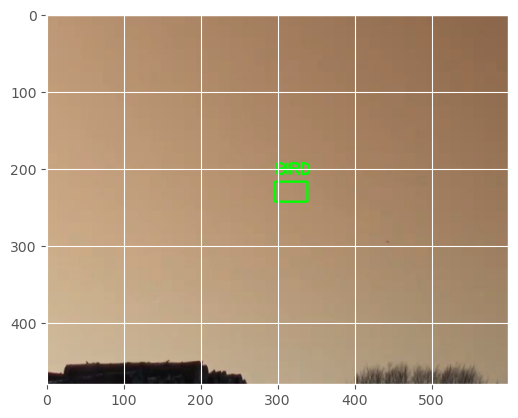

1/1 [==============================] - 0s 22ms/step


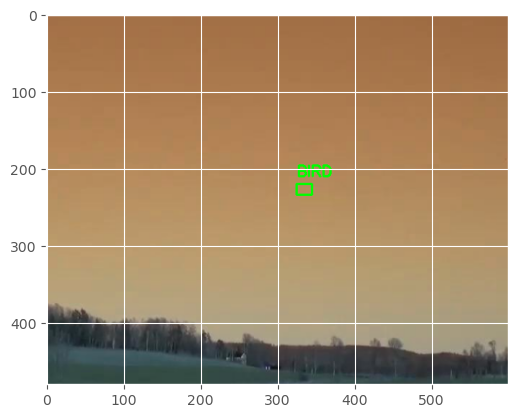

1/1 [==============================] - 0s 21ms/step


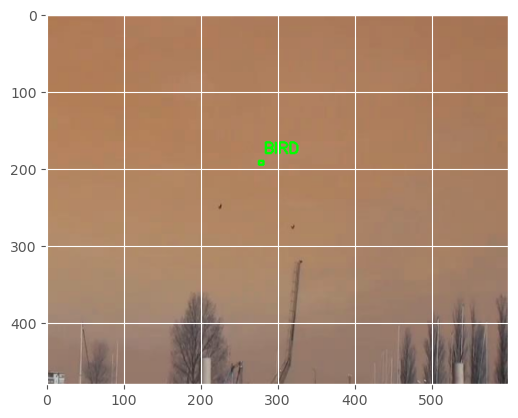

1/1 [==============================] - 0s 21ms/step


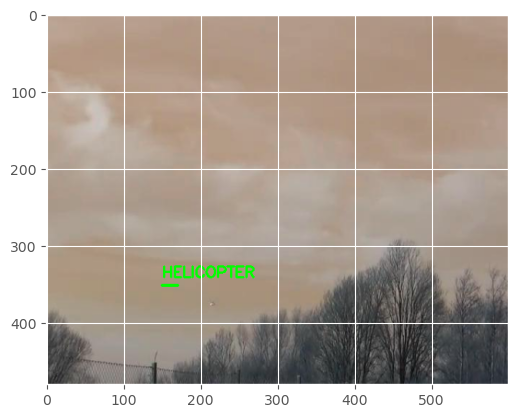

1/1 [==============================] - 0s 22ms/step


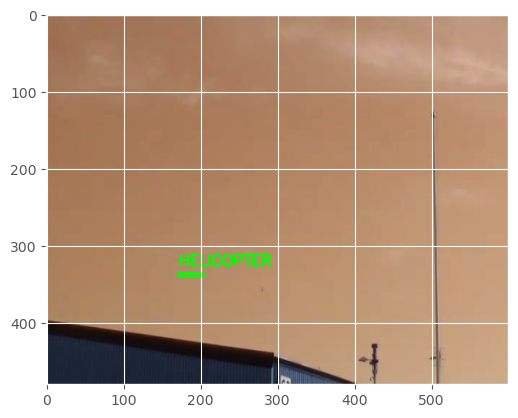

1/1 [==============================] - 0s 22ms/step


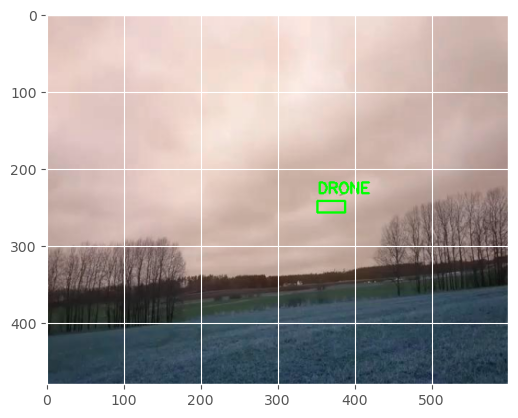

1/1 [==============================] - 0s 21ms/step


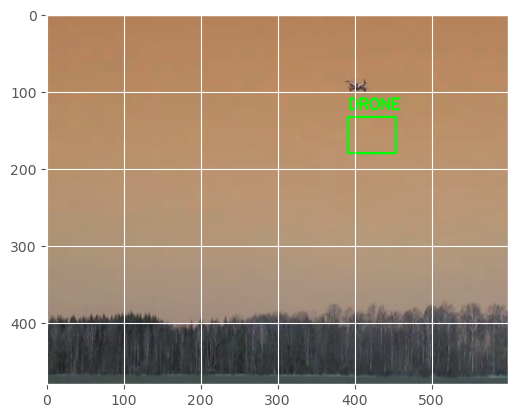

1/1 [==============================] - 0s 23ms/step


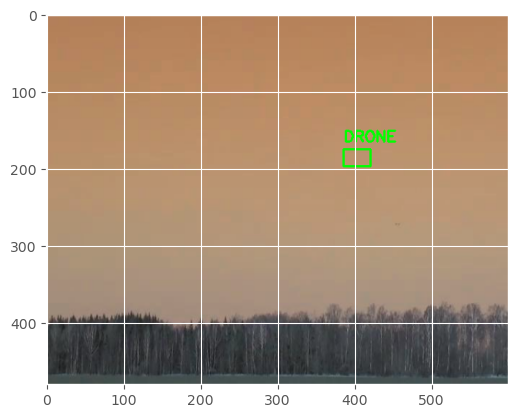

1/1 [==============================] - 0s 21ms/step


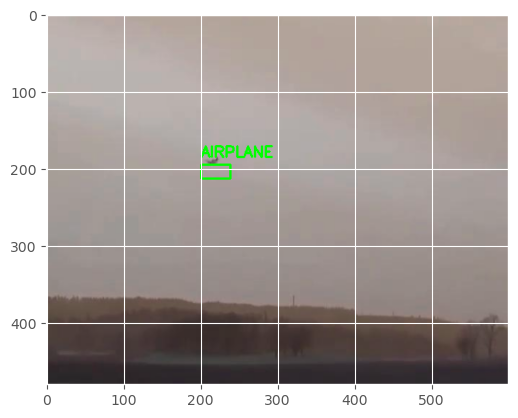

1/1 [==============================] - 0s 22ms/step


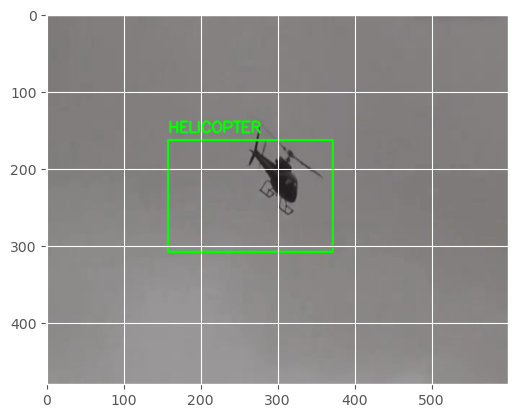

1/1 [==============================] - 0s 22ms/step


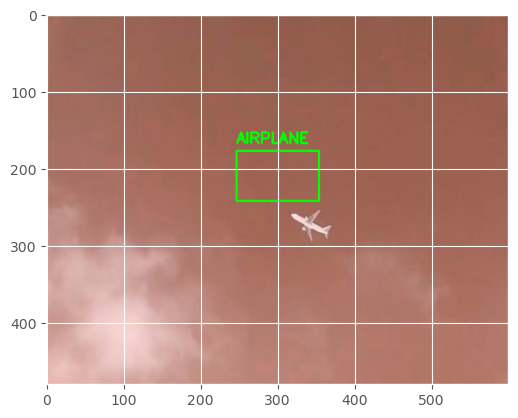

1/1 [==============================] - 0s 20ms/step


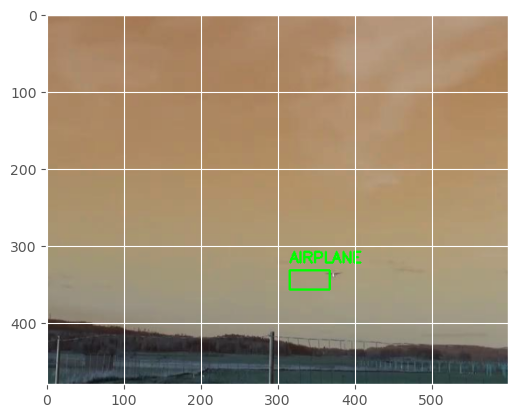

1/1 [==============================] - 0s 23ms/step


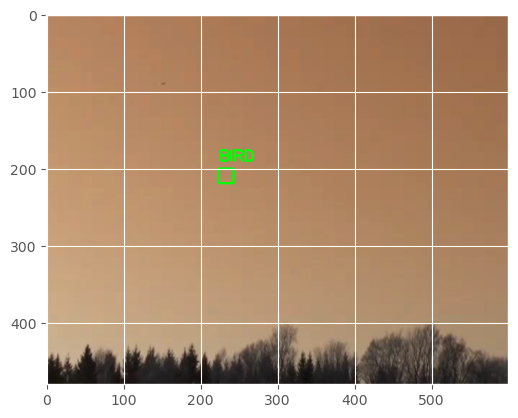

1/1 [==============================] - 0s 22ms/step


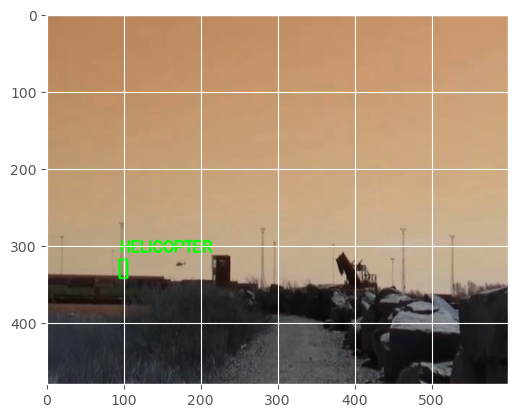

1/1 [==============================] - 0s 21ms/step


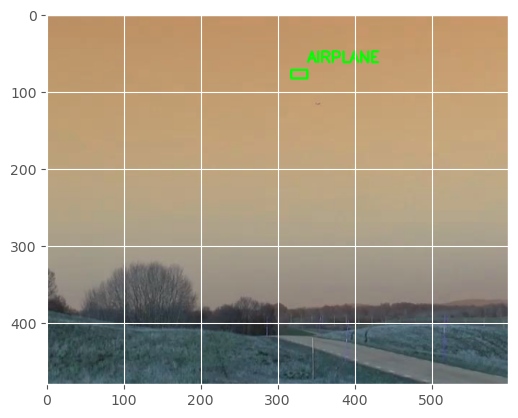

1/1 [==============================] - 0s 22ms/step


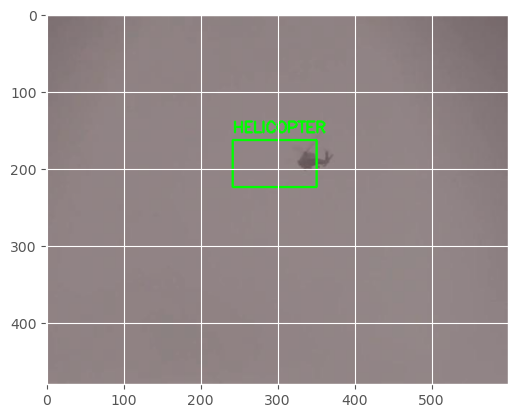

1/1 [==============================] - 0s 21ms/step


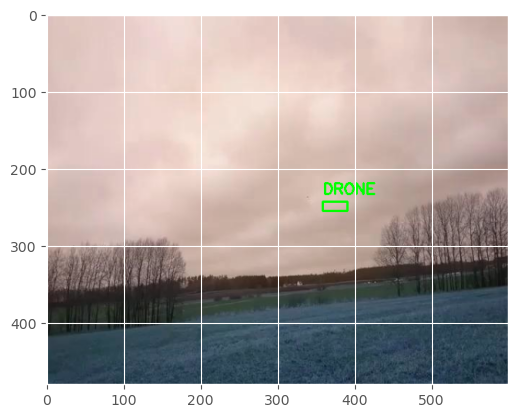

1/1 [==============================] - 0s 21ms/step


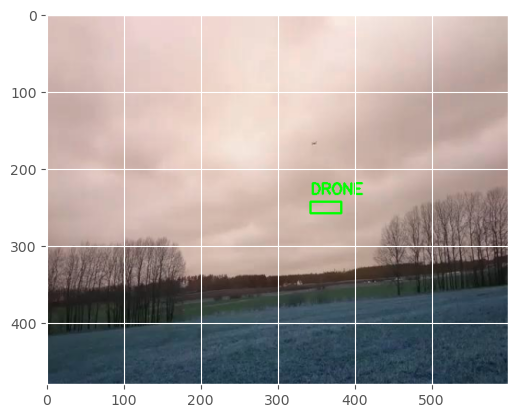

1/1 [==============================] - 0s 23ms/step


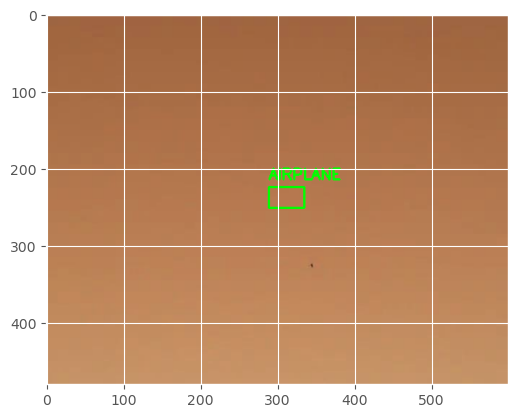

1/1 [==============================] - 0s 21ms/step


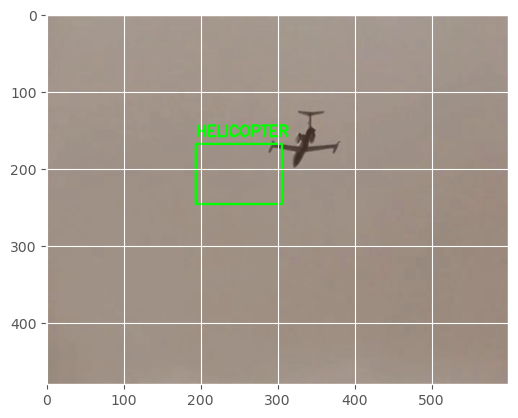

1/1 [==============================] - 0s 22ms/step


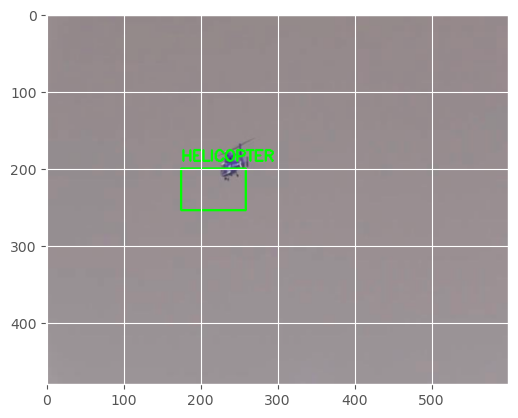

1/1 [==============================] - 0s 23ms/step


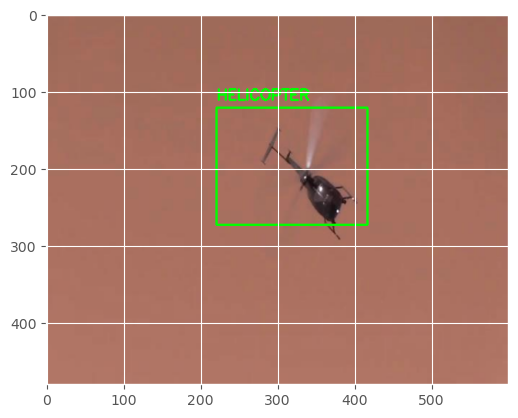

1/1 [==============================] - 0s 22ms/step


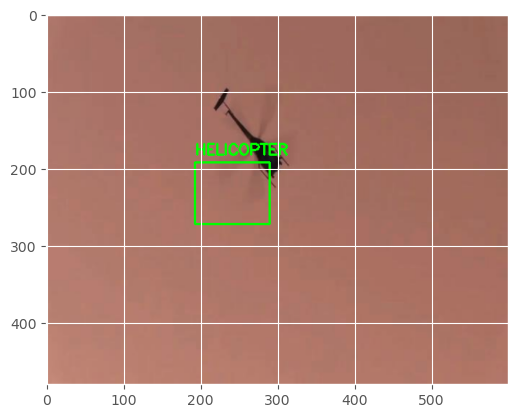

1/1 [==============================] - 0s 21ms/step


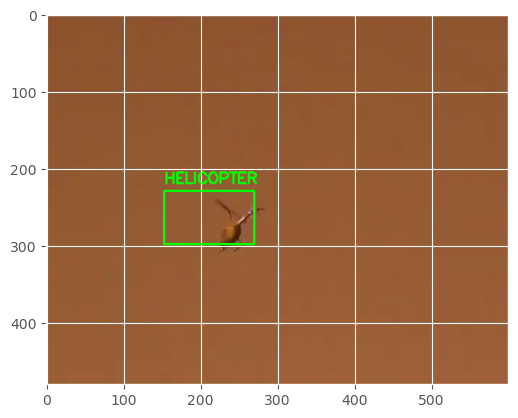

1/1 [==============================] - 0s 23ms/step


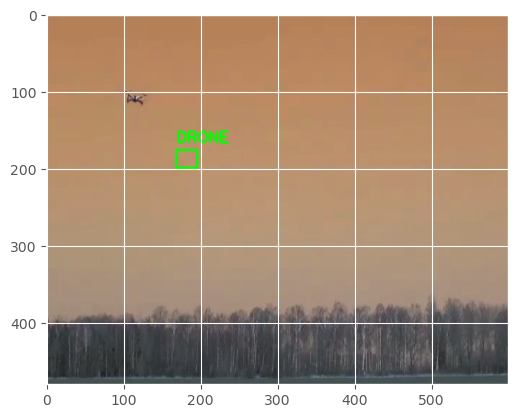

1/1 [==============================] - 0s 28ms/step


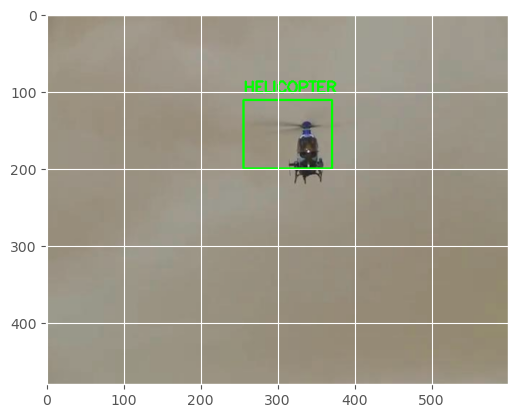

1/1 [==============================] - 0s 25ms/step


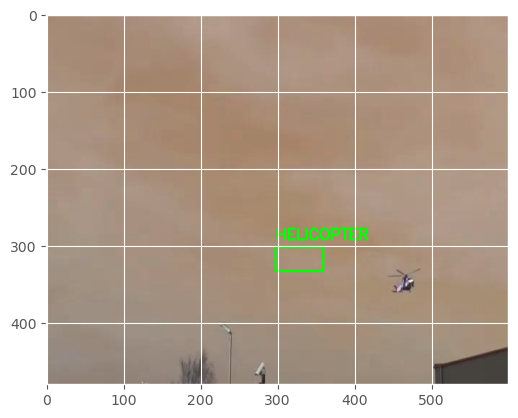

1/1 [==============================] - 0s 55ms/step


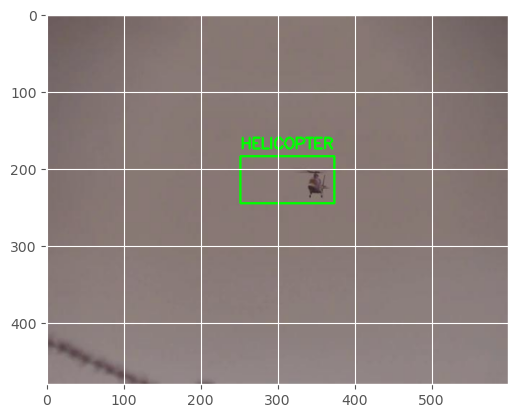

1/1 [==============================] - 0s 57ms/step


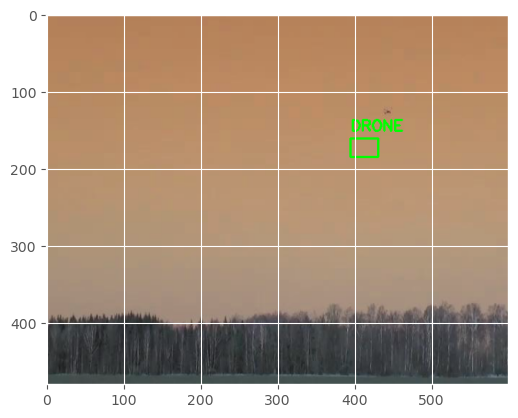

1/1 [==============================] - 0s 33ms/step


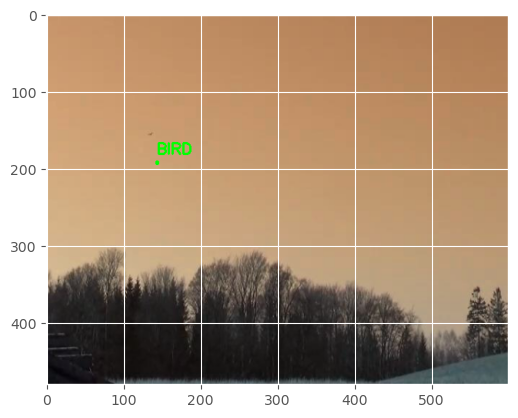

1/1 [==============================] - 0s 26ms/step


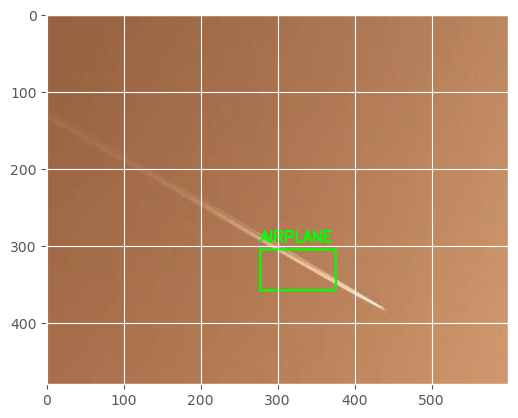

1/1 [==============================] - 0s 23ms/step


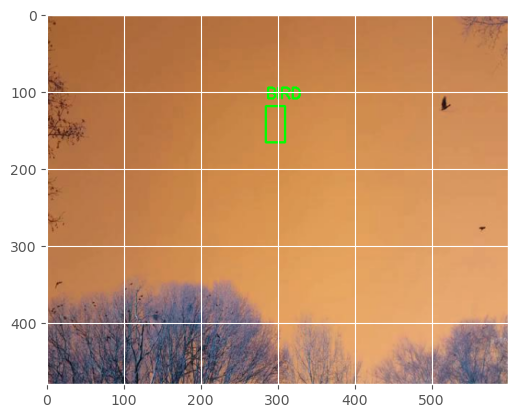

1/1 [==============================] - 0s 23ms/step


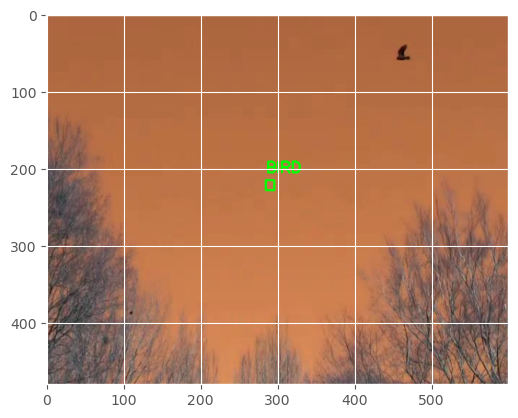

1/1 [==============================] - 0s 22ms/step


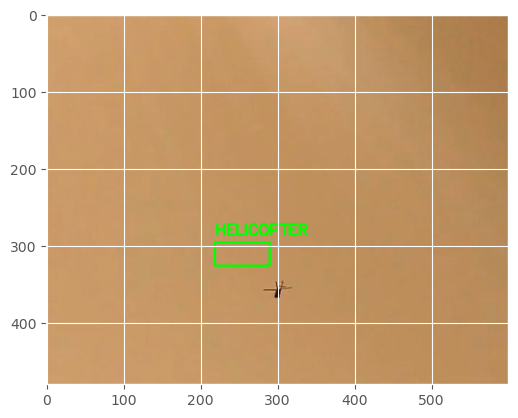

1/1 [==============================] - 0s 23ms/step


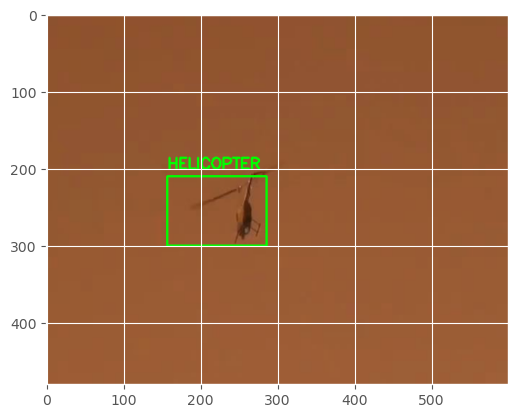

1/1 [==============================] - 0s 22ms/step


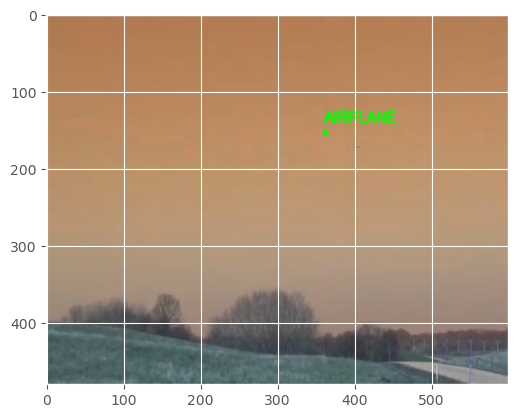

1/1 [==============================] - 0s 23ms/step


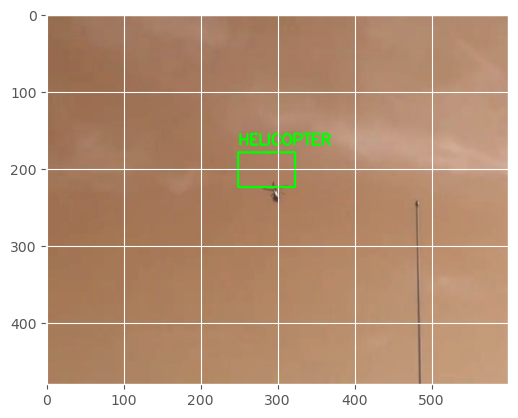

1/1 [==============================] - 0s 25ms/step


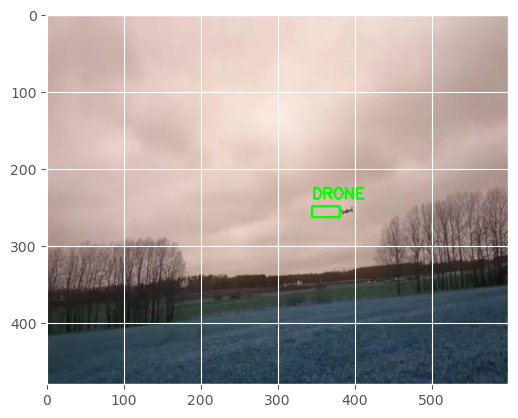

1/1 [==============================] - 0s 22ms/step


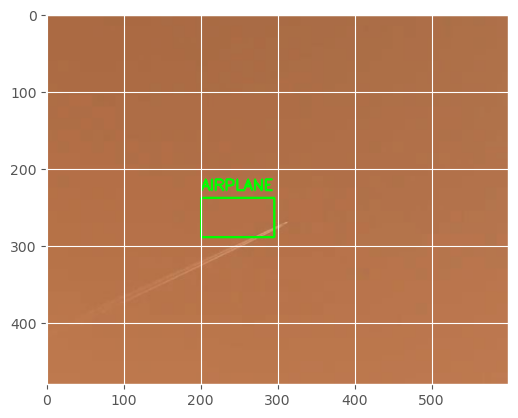

1/1 [==============================] - 0s 22ms/step


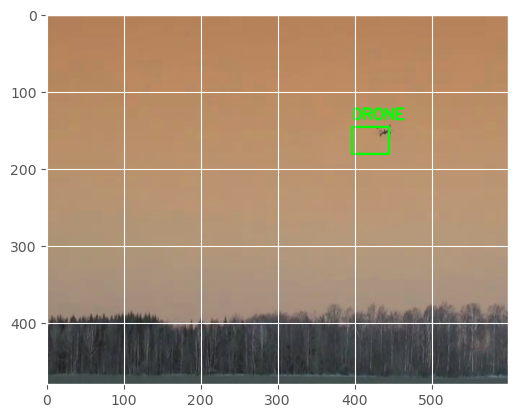

1/1 [==============================] - 0s 22ms/step


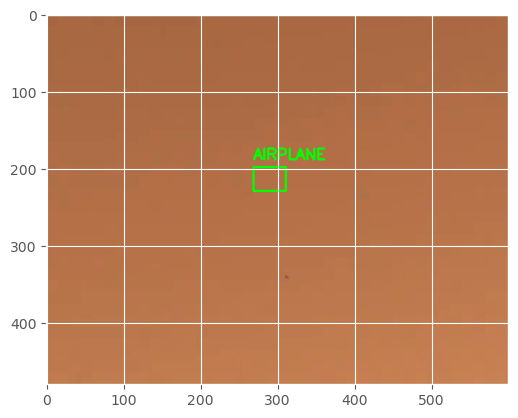

1/1 [==============================] - 0s 22ms/step


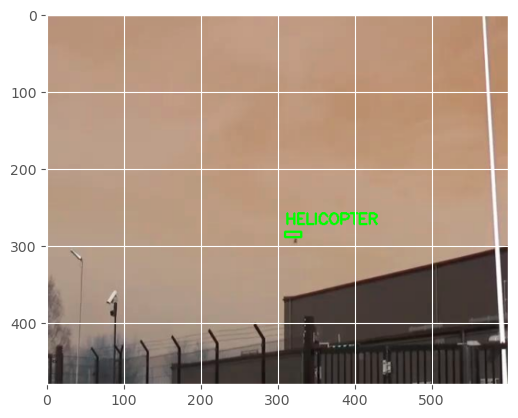

1/1 [==============================] - 0s 21ms/step


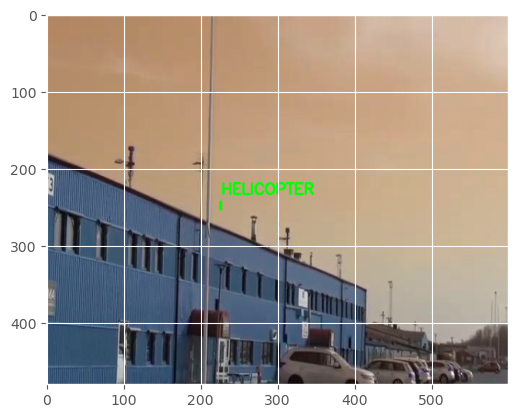

1/1 [==============================] - 0s 21ms/step


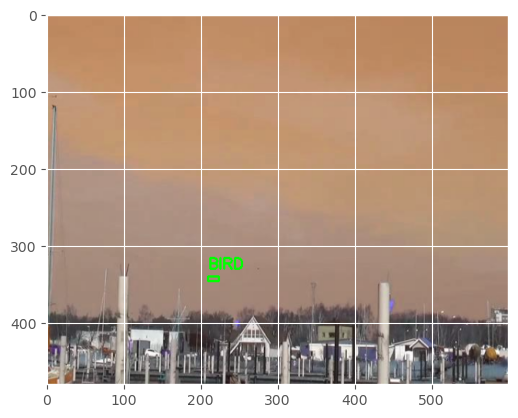

1/1 [==============================] - 0s 21ms/step


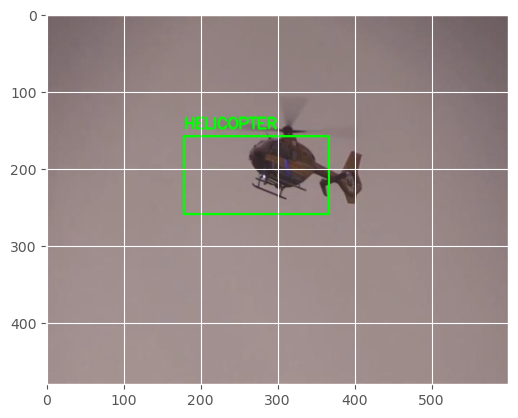

1/1 [==============================] - 0s 21ms/step


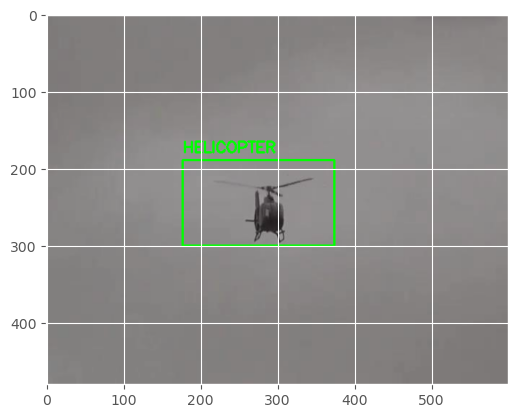

1/1 [==============================] - 0s 21ms/step


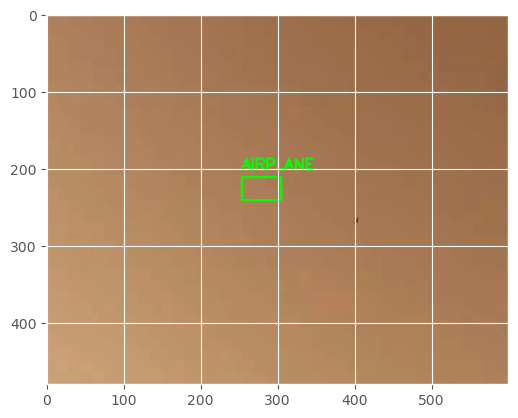

1/1 [==============================] - 0s 22ms/step


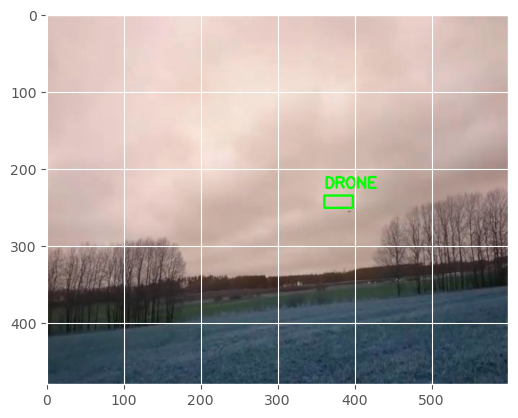

1/1 [==============================] - 0s 21ms/step


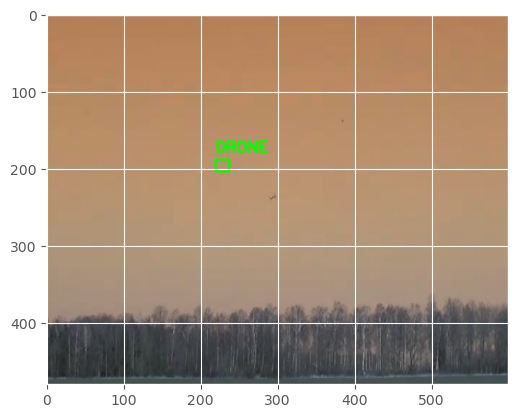

1/1 [==============================] - 0s 22ms/step


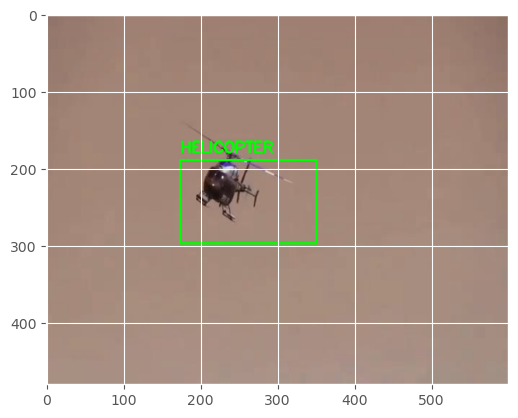

1/1 [==============================] - 0s 25ms/step


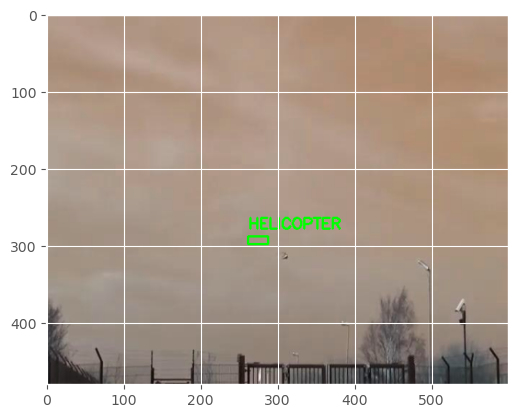

In [88]:
# loop over the images that we'll be testing using our bounding box
# regression model

c=0
data=[]
itera = 0
for imagePath in imagePaths:
    itera+=1
    # load the input image (in Keras format) from disk and preprocess
    # it, scaling the pixel intensities to the range [0, 1]
    image = load_img(imagePath, target_size=(224, 224))
    image = img_to_array(image) / 255.0
    image = np.expand_dims(image, axis=0)
    # predict the bounding box of the object along with the class
    # label
    (boxPreds, labelPreds) = model.predict(image)
    (startX, startY, endX, endY) = boxPreds[0]
    c+=1
    # determine the class label with the largest predicted
    # probability
    i = np.argmax(labelPreds, axis=1)
    label = lb.classes_[i][0]
    # load the input image (in OpenCV format), resize it such that it
    # fits on our screen, and grab its dimensions
    image = cv2.imread(imagePath)
    image = imutils.resize(image, width=600)
    (h, w) = image.shape[:2]
    # scale the predicted bounding box coordinates based on the image
    # dimensions
    startX = int(startX * w)
    startY = int(startY * h)
    endX = int(endX * w)
    endY = int(endY * h)
    if itera not in [23,27,29,67]:
        path=str(c)+'.jpeg'
        l=[i[0],0.8,startX, startY, endX-startX, endY-startY]
        ml=[path,l]
        path=str(c)+'.jpeg'
        data.append(ml)
        
    # draw the predicted bounding box and class label on the image

    y = startY - 10 if startY - 10 > 10 else startY + 10
    cv2.putText(image, label, (startX, y), cv2.FONT_HERSHEY_SIMPLEX,0.65, (0, 255, 0), 2)
    cv2.rectangle(image, (startX, startY), (endX, endY),(0, 255, 0), 2)
    # show the output image
    plt.imshow(image)
    plt.show()
    # cv2.waitKey(0)
sub_df=pd.DataFrame(data,columns=['Test Image','Prediction String'])

In [89]:
sub_df.to_csv('submission.csv', index=False)